In [1]:
# Basic library for all of our dataset operations
import numpy as np
import pandas as pd 
from datetime import timedelta, datetime

# data visualization
import plotly.graph_objs as go
from plotly.graph_objs import Bar, Layout
from plotly import offline
from pylab import rcParams 
'''
rcParams are used to dynamically  change the default rc (runtime configuration) settings 
All rc settings are stored in a dictionary-like variable called matplotlib.rcParams
''' 
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="whitegrid")
sns.set(rc={'figure.figsize':(11.7,8.27)})

# prediction models
import pmdarima as pm
import tensorflow as tf
import statsmodels as sm
import xgboost as xgb
import lightgbm as lgb # LightGBM is a gradient boosting framework that uses tree based learning algorithms.
# from bayes_opt import BayesianOptimization
# from gluonts.dataset.common import ListDataset
# from gluonts.evaluation.backtest import make_evaluation_predictions
# from gluonts.model.deepar import DeepAREstimator
# from gluonts.mx.trainer import Trainer
from sklearn import linear_model, svm
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import make_scorer, mean_squared_error
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.ar_model import AutoReg 
from statsmodels.tsa.arima_model import ARIMA, ARMA
from statsmodels.tsa.holtwinters import ExponentialSmoothing, SimpleExpSmoothing
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa import api as smt
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from rich.progress import track # track concurrent tasks with a bar and progress information

from metrics import evaluate # metrics is a prebuilt py file 

import warnings
import pickle # implements binary protocols for serializing and de-serializing a Python object structure
import re # regular expression matching operations
from math import sqrt

# We will use deprecated models of statmodels which throw a lot of warnings to use more modern ones
warnings.filterwarnings("ignore")


# Extra settings
seed = 42
tf.random.set_seed(seed)
np.random.seed(seed)
plt.style.use('bmh')
mpl.rcParams['axes.labelsize'] = 14
mpl.rcParams['xtick.labelsize'] = 12
mpl.rcParams['ytick.labelsize'] = 12
mpl.rcParams['text.color'] = 'k'
rcParams['figure.figsize'] = 18, 8
plt.rcParams['font.sans-serif']=['SimHei'] #用来正常显示中文标签 to display labels in Chinese
plt.rcParams['axes.unicode_minus'] = False #用来正常显示负号 to display minus sign

# change text color
import colorama
from colorama import Fore, Style

# IPython: contains a Jupyter kernel to work with Python code in Jupyter notebooks 
from IPython.display import IFrame

print(tf.__version__)

2.7.0


# 1. Import Data

- Global and US COVID Data: read .csv files from JHU-CSSE-github
    
    Data Source：https://github.com/CSSEGISandData/COVID-19/tree/master/csse_covid_19_data
    
    For the data update frequency: basically once per day / refer to README.md in the data source link above.


- SHANGHAI COVID data: web scraping from the website of Shanghai Municipal Health Commision 上海卫健委

    Data Source：https://wsjkw.sh.gov.cn/yqtb/index.html

## 1.1 Get Time Series Data (ts) 

- time_series_covid19_confirmed_US.csv    --> ts_confirmed_us
- time_series_covid19_confirmed_global.csv --> ts_confirmed_global
- time_series_covid19_deaths_US.csv      --> ts_deaths_us
- time_series_covid19_deaths_global.csv   --> ts_deaths_global
- time_series_covid19_recovered_global.csv --> ts_recovered_global

In [2]:
def GET_csse_covid_19_time_series():

    print('Loading【TS】Data......')
    repo = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/'

    ts_confirmed_us = pd.read_csv(repo+'time_series_covid19_confirmed_US.csv')
    ts_confirmed_global = pd.read_csv(repo+'time_series_covid19_confirmed_global.csv')

    ts_deaths_us = pd.read_csv(repo+'time_series_covid19_deaths_US.csv')
    ts_deaths_global = pd.read_csv(repo+'time_series_covid19_deaths_global.csv')

    ts_recovered_global = pd.read_csv(repo+'time_series_covid19_recovered_global.csv')

    print('Finish Loading')
    return ts_confirmed_us,ts_confirmed_global,ts_deaths_us,ts_deaths_global,ts_recovered_global

In [3]:
ts_confirmed_us,ts_confirmed_global,ts_deaths_us,ts_deaths_global,ts_recovered_global = GET_csse_covid_19_time_series()

Loading【TS】Data......
Finish Loading


In [4]:
# a glance at ts data
ts_confirmed_us.head()

,UID,iso2,iso3,code3,FIPS,Admin2,Province_State,Country_Region,Lat,Long_,...,6/21/22,6/22/22,6/23/22,6/24/22,6/25/22,6/26/22,6/27/22,6/28/22,6/29/22,6/30/22
0,84001001,US,USA,840,1001.0,Autauga,Alabama,US,32.539527,-86.644082,...,16313,16330,16360,16400,16400,16400,16468,16496,16520,16536
1,84001003,US,USA,840,1003.0,Baldwin,Alabama,US,30.727750,-87.722071,...,58009,58169,58293,58372,58372,58372,58595,58695,58796,58905
2,84001005,US,USA,840,1005.0,Barbour,Alabama,US,31.868263,-85.387129,...,5813,5818,5825,5832,5832,5832,5857,5863,5880,5891
3,84001007,US,USA,840,1007.0,Bibb,Alabama,US,32.996421,-87.125115,...,6630,6648,6654,6663,6663,6663,6679,6687,6700,6704
4,84001009,US,USA,840,1009.0,Blount,Alabama,US,33.982109,-86.567906,...,15246,15249,15272,15283,15283,15283,15324,15335,15351,15370


In [5]:
ts_confirmed_global.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,6/21/22,6/22/22,6/23/22,6/24/22,6/25/22,6/26/22,6/27/22,6/28/22,6/29/22,6/30/22
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,181808,181912,181987,182033,182072,182149,182228,182324,182403,182528
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,277663,277940,278211,278504,278793,279077,279077,279167,280298,280851
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,265993,266006,266015,266025,266030,266038,266049,266062,266073,266087
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,43449,43774,43774,43774,43774,43774,43774,43774,43774,43774
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,99761,99761,99761,99761,99761,99761,99761,101320,101320,101320


## 1.2 Get Cross-Sectional Data

- csse_covid_19_daily_reports --> latest_data_global, prev_data_global
- csse_covid_19_daily_reports_us --> latest_data_us, prev_data_us

These two files contain daily reports named by 'MM-DD-YYYY.csv'. Refer to README.md in the data source link https://github.com/CSSEGISandData/COVID-19/tree/master/csse_covid_19_data

In [6]:
def GET_csse_covid_19_daily_reports():

    print('Loading【Cross-Sectional】Data......')

    # get the latest date and one-day previous date in the format of MM-DD-YYYY
    ts_confirmed_us = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_US.csv')
    latest = pd.to_datetime(ts_confirmed_us.columns[-1]).strftime('%m-%d-%Y')
    prev = (pd.to_datetime(ts_confirmed_us.columns[-1])+timedelta(-1)).strftime('%m-%d-%Y')
    
    # f string to concat
    url_latest_global = f'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports/{latest}.csv'
    latest_data_global = pd.read_csv(url_latest_global)

    url_prev_global = f'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports/{prev}.csv'
    prev_data_global = pd.read_csv(url_prev_global)

    url_latest_us = f'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/{latest}.csv'
    latest_data_us = pd.read_csv(url_latest_us)

    url_prev_us = f'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/{prev}.csv'
    prev_data_us = pd.read_csv(url_prev_us)


    print('Finish Loading')
    return latest_data_global,prev_data_global,latest_data_us,prev_data_us

In [7]:
latest_data_global,prev_data_global,latest_data_us,prev_data_us = GET_csse_covid_19_daily_reports()

Loading【Cross-Sectional】Data......
Finish Loading


## 1.3 Get Shanghai Data

- time series data: ts_shanghai_covid
- dates from 2021-01-01 to 2022-06-12(data source was last updated)
- one series is for confirmed cases increment 新增本土确诊	
- another series is for asymptomatic cases increment 新增本土无症状

In [8]:
def GET_shanghai_data(plot = False, encoding = "UTF-8"):
    # plot：whether plot or not,default is True
    import re
    
    print('Loading and processing【SHANGHAI】data（data is web scraped from Shanghai Municipal Health Commision）......')
    #url = f'https://raw.githubusercontent.com/datoujinggzj/WhalePkg/master/DATA/ts_shanghai_covid.csv'
    url = f'https://raw.githubusercontent.com/yuy221/DATA/main/ts_shanghai_covid.csv'
    data = pd.read_csv(url,encoding = encoding)['detail'] # only need detail col
    print('Finish Loading')

    data = data[data.apply(lambda x: x.startswith('上海202'))].sort_values()
    data = data.apply(lambda x: re.sub(r'\（.*?\）', '', x))  # delete chaotic and useless punctuations
    data = data.apply(lambda x: x.replace('无新增','0'))

    # np.ravel unfold each record in the series把列表展开, findall to get numbers取数字
    df_all = pd.DataFrame(map(np.ravel,data.apply(lambda x: re.findall(r"\d+",x)))).rename({
        0:'Year',
        1:'Month',
        2:'Day',
        3:'New_confirmed_cases_domestic',
        4:'New_asymptomatic_cases_domestic'
    },axis=1).iloc[:,:5]
    df_all['Date'] = df_all['Year'].map(str)+"/"+df_all['Month'].map(str)+"/"+df_all['Day'].map(str)
    df_all['Date'] = pd.to_datetime(df_all['Date'])

    df_all = df_all.set_index('Date').sort_index()
    df_all = df_all.astype('int32')
    df = df_all.iloc[:,3:5]

    if plot:
        fig, axes = plt.subplots(nrows=2, ncols=1,figsize = [10,5*2])
        df_2022 = df[df.index>'2022-01-01']
        # write a code block to plot all the axes
        for col,ax in zip(df_2022.columns,axes):
            ax.step(df_2022.index, df_2022[col], color = '#202124',linewidth = 2)
            ax.bar(df_2022.index, df_2022[col],alpha = .8)
            ax.vlines(x=pd.to_datetime("2022-04-01"), ymin=0, ymax=df[col].max(), linewidth=2, color = '#4b7ffc', linestyle = '--')
            ax.vlines(x=pd.to_datetime("2022-06-01"), ymin=0, ymax=df[col].max(), linewidth=2, color = '#4b7ffc', linestyle = '--')

            ax.hlines(y=df[col].max(), xmin=df_2022.index[0], xmax=df_2022.index[-1], linewidth=1, color = '#ff0000')
            ax.text(x = df_2022.index[0], s=df[col].max(),y = df[col].max(), color = 'black', fontsize = 14)
            ax.text(x = df_2022.index[0], s=f"Max：Date：{str(df.index[df[col].argmax()])} \nNew_cases：{df[col].max()}",y = df[col].max()/2, color = '#ff0000', fontsize = 18)
            ax.text(x = df_2022.index[0], s=f"Today：Date：{str(df.index[-1])} \nNew_cases：{df[col][-1]}",y = df[col].max()/4, color = '#ff0000', fontsize = 18)

            ax.text(x = pd.to_datetime("2022-03-15"), s="SH Lockdown\n4/1/2022",y = df[col].max()*2/3, color = 'black', fontsize = 12)
            ax.text(x = pd.to_datetime("2022-05-15"), s="SH Unblock\n6/1/2022",y = df[col].max()*2/3, color = 'black', fontsize = 12)

            ax.set_xlabel('Date')
            ax.set_ylabel(f'{col}cases')
            ax.set_title(f'{col}Time_series_trend_plot',fontsize = 16)

        plt.tight_layout()

    return df

In [9]:
ts_shanghai_covid = GET_shanghai_data(plot=False)

Loading and processing【SHANGHAI】data（data is web scraped from Shanghai Municipal Health Commision）......
Finish Loading


Loading and processing【SHANGHAI】data（data is web scraped from Shanghai Municipal Health Commision）......
Finish Loading


,New_confirmed_cases_domestic,New_asymptomatic_cases_domestic
Date,,
2021-01-01,0,4
2021-01-02,0,6
2021-01-03,0,4
2021-01-04,0,6
2021-01-05,0,2
...,...,...
2022-06-07,4,11
2022-06-08,4,5
2022-06-09,6,5


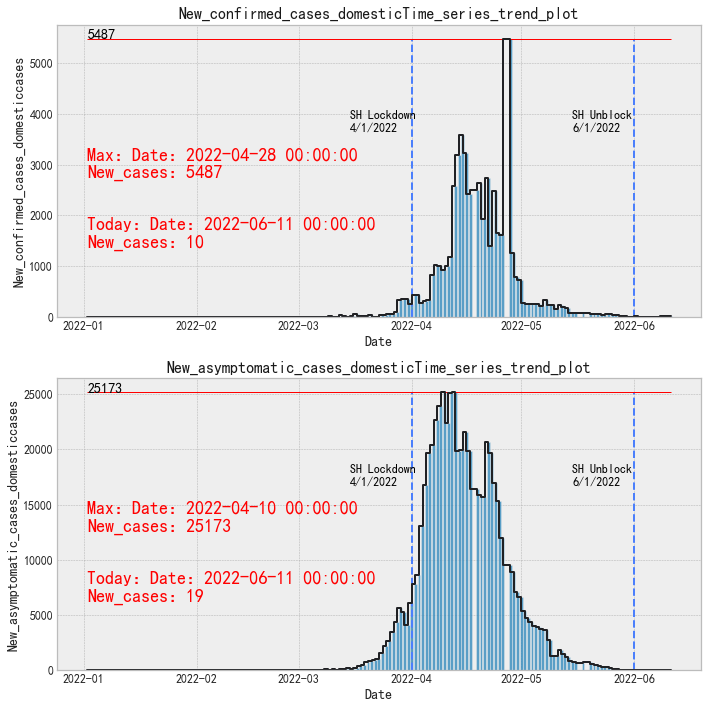

In [10]:
GET_shanghai_data(plot = True)

# 2. Data Cleaning

## 2.1 China ts data preprocessing

get China ts data from global ts data by filtering [Country/Region] and drop useless columns

cols: provinces

index: dates in format MM-DD-YYY

In [11]:
ts_confirmed_global.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,6/21/22,6/22/22,6/23/22,6/24/22,6/25/22,6/26/22,6/27/22,6/28/22,6/29/22,6/30/22
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,181808,181912,181987,182033,182072,182149,182228,182324,182403,182528
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,277663,277940,278211,278504,278793,279077,279077,279167,280298,280851
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,265993,266006,266015,266025,266030,266038,266049,266062,266073,266087
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,43449,43774,43774,43774,43774,43774,43774,43774,43774,43774
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,99761,99761,99761,99761,99761,99761,99761,101320,101320,101320


In [12]:
data1 = ts_confirmed_global.copy() 
data1 = data1[data1['Country/Region'] == 'China']
data1 = data1.set_index('Province/State')
data1 = data1.drop(['Country/Region','Lat','Long'],axis=1)

data1 = data1.diff(axis=1).fillna({data1.columns[0]:data1[data1.columns[0]]},downcast = 'infer') # .clip(lower=0)
# 1.diff(axis=1) change cumulative numbers into incre_numbers: currdate_data - prevdate_data 
# 2.fillna() cauze the first data doesn't have prevdate_data and will become NaN; fill with its original value
# 3.downcast = 'infer' to keep original datatype
# 4.if add .clip(lower=0), set all the negative incre to 0; if not add, allow neg

data1 = data1.sort_values(by = data1.columns[-1],ascending=False) # sort by values in last col DESC
data1 = data1.T # time-indexed
data1 = data1.dropna().drop('Unknown',axis=1)
data1.index = pd.to_datetime(data1.index)
data1.columns.name = '' # delete original columns name 'Province/State'

ts_data_processed = data1
ts_data_processed 

,Hong Kong,Macau,Anhui,Fujian,Shanghai,Shandong,Shaanxi,Tianjin,Sichuan,Zhejiang,...,Heilongjiang,Ningxia,Hebei,Liaoning,Jilin,Beijing,Inner Mongolia,Hunan,Hubei,Jiangxi
2020-01-22,0,1,1,1,9,2,0,4,5,10,...,0,1,1,2,0,14,0,4,444,2
2020-01-23,2,1,8,4,7,4,3,0,3,17,...,2,0,0,1,1,8,0,5,0,5
2020-01-24,0,0,6,5,4,9,2,4,7,16,...,2,1,1,1,2,14,1,15,105,11
2020-01-25,3,0,24,8,13,12,10,2,13,19,...,5,1,6,13,1,5,6,19,212,0
2020-01-26,3,3,21,17,7,19,7,4,16,42,...,6,1,5,4,0,27,0,26,297,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-26,1917,0,0,4,8,0,6,5,1,2,...,0,0,0,0,0,3,0,0,1,0
2022-06-27,1873,43,0,6,3,0,0,0,0,1,...,0,0,0,0,0,1,0,0,0,0
2022-06-28,1685,17,0,4,1,2,0,0,1,0,...,0,0,0,0,0,1,0,0,0,3
2022-06-29,2004,16,1,7,10,0,2,0,1,0,...,0,0,0,0,0,3,0,0,0,0


In [13]:
# define a func to include all the data process above
def ts_process_CHINA(ts_data,clip = False):
    ts_data = ts_data[ts_data['Country/Region'] == 'China']
    # get loc
    loc_data = ts_data[['Province/State','Lat','Long']]
    loc_data = loc_data[loc_data['Province/State'] != 'Unknown']

    ts_data = ts_data.set_index('Province/State').drop(['Country/Region','Lat','Long'],axis=1)
    if clip:
        ts_data = ts_data.diff(axis=1).fillna({ts_data.columns[0]:ts_data[ts_data.columns[0]]},downcast = 'infer').clip(lower=0)
    else:
        ts_data = ts_data.diff(axis=1).fillna({ts_data.columns[0]:ts_data[ts_data.columns[0]]},downcast = 'infer')
    ts_data = ts_data.sort_values(by = ts_data.columns[-1],ascending=False)
    ts_data = ts_data.T.dropna().drop('Unknown',axis=1)
    ts_data.index = pd.to_datetime(ts_data.index)
    ts_data.columns.name = ''
    sorted_provinces = ts_data.columns
    return ts_data,loc_data,sorted_provinces 

## 2.2 US ts data preprocessing
similar to China ts data 

cols: provinces/states

index: dates in format MM-DD-YYY

In [14]:
ts_confirmed_us.head()
# us ts data contains more cols than global data, e.g.Admin2 means county level data
# only care about state level,so group by state and sum all the case in the group

,UID,iso2,iso3,code3,FIPS,Admin2,Province_State,Country_Region,Lat,Long_,...,6/21/22,6/22/22,6/23/22,6/24/22,6/25/22,6/26/22,6/27/22,6/28/22,6/29/22,6/30/22
0,84001001,US,USA,840,1001.0,Autauga,Alabama,US,32.539527,-86.644082,...,16313,16330,16360,16400,16400,16400,16468,16496,16520,16536
1,84001003,US,USA,840,1003.0,Baldwin,Alabama,US,30.727750,-87.722071,...,58009,58169,58293,58372,58372,58372,58595,58695,58796,58905
2,84001005,US,USA,840,1005.0,Barbour,Alabama,US,31.868263,-85.387129,...,5813,5818,5825,5832,5832,5832,5857,5863,5880,5891
3,84001007,US,USA,840,1007.0,Bibb,Alabama,US,32.996421,-87.125115,...,6630,6648,6654,6663,6663,6663,6679,6687,6700,6704
4,84001009,US,USA,840,1009.0,Blount,Alabama,US,33.982109,-86.567906,...,15246,15249,15272,15283,15283,15283,15324,15335,15351,15370


In [15]:
# define a function to process us ts data
# when death=Flase, process ts_confirmed_us
# when death=True, process ts_deaths_us (has different cols from ts_confirmed_us)
# clip default to be False, allowing for neg incre

def ts_process_US(ts_data, death = False, clip = False):
    # get loc
    ts_data = ts_data.dropna()
    loc_data = ts_data[['UID','FIPS','Admin2','Province_State','Lat','Long_']]

    ts_data = ts_data.set_index(['Province_State','Admin2']).iloc[:,9:]
    if death:
        population = ts_data.groupby('Province_State')['Population'].sum()
        ts_data = ts_data.drop('Population',axis=1)

    if clip:
        ts_data = ts_data.diff(axis=1).fillna({ts_data.columns[0]:ts_data[ts_data.columns[0]]},downcast = 'infer').clip(lower=0)
    else:
        ts_data = ts_data.diff(axis=1).fillna({ts_data.columns[0]:ts_data[ts_data.columns[0]]},downcast = 'infer')
    ts_data = ts_data.groupby('Province_State').sum()
    ts_data = ts_data.sort_values(by = ts_data.columns[-1],ascending=False)
    ts_data = ts_data.T
    ts_data.index = pd.to_datetime(ts_data.index)
    ts_data.columns.name = ''

    sorted_state = ts_data.columns

    if death:
        return ts_data,loc_data,sorted_state,population
    return ts_data,loc_data,sorted_state

## 2.3 China and US Cross-Sectional Data preprocessing

deal with cross-sectional data sets: 
- latest_data_global
- prev_data_global
- latest_data_us
- prev_data_us

cols needed: 'Province_State', 'Last_Update', 'Confirmed', 'Deaths', 'Incident_Rate', 'Case_Fatality_Ratio'

index: Province_State

In [16]:
def daily_process(daily_data, country = 'China'):
    if country == 'China':
        daily_data = daily_data[(daily_data['Country_Region'] == 'China')&(daily_data['Province_State']!='Unknown')]
    elif country == 'US':
        daily_data = daily_data
    cols_use = ['Province_State','Last_Update','Confirmed','Deaths','Incident_Rate','Case_Fatality_Ratio']

    # sorted_provinces is provided
    daily_data_processed = daily_data[cols_use].set_index(daily_data['Province_State'])
    daily_data_processed.index.name = ""
    daily_data_processed = daily_data_processed.dropna()
    return daily_data_processed

In [17]:
# get cleaned China ts data
ts_confirmed_CHINA_incre, loc_data_CHINA, sorted_provinces = ts_process_CHINA(ts_confirmed_global,clip=False)
ts_deaths_CHINA_incre, _, _ = ts_process_CHINA(ts_deaths_global,clip=False)
ts_recovered_CHINA_incre, _, _ = ts_process_CHINA(ts_recovered_global,clip=False)

# get cleaned US ts data
ts_confirmed_US_incre,loc_data_us,sorted_state = ts_process_US(ts_confirmed_us,clip=False)
ts_deaths_US_incre,_,_,population = ts_process_US(ts_deaths_us,death = True,clip=False)

# get cleaned cs/daily data
latest_data_CHINA = daily_process(latest_data_global, country = 'China')
prev_data_CHINA = daily_process(prev_data_global, country = 'China')
latest_data_US = daily_process(latest_data_us, country = 'US')
prev_data_US = daily_process(prev_data_us, country = 'US')

In [18]:
ts_confirmed_US_incre

,Pennsylvania,Ohio,Texas,Florida,New York,Utah,California,Oklahoma,Puerto Rico,Illinois,...,Alaska,Minnesota,Michigan,Kansas,Indiana,Idaho,Hawaii,Georgia,Arizona,Wyoming
2020-01-22,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-01-23,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-01-24,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
2020-01-25,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2020-01-26,0,0,0,0,0,0,2,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-26,0,0,8973,0,2807,0,0,0,3662,0,...,0,0,0,0,0,0,0,0,0,0
2022-06-27,1401,0,10314,16518,10668,0,13895,0,1421,9904,...,0,1510,0,0,4139,885,0,0,0,0
2022-06-28,0,0,10604,0,2119,0,50753,0,806,4241,...,0,3351,14349,88,0,0,0,0,0,1116
2022-06-29,0,0,10718,22440,7623,0,6885,0,3481,4645,...,3104,1281,0,4936,3168,1352,5362,20971,16514,0


In [19]:
latest_data_CHINA

,Province_State,Last_Update,Confirmed,Deaths,Incident_Rate,Case_Fatality_Ratio
,,,,,,
Anhui,Anhui,2022-07-01 04:21:10,1075,6,1.699873,0.558140
Beijing,Beijing,2022-07-01 04:21:10,3683,9,17.098422,0.244366
Chongqing,Chongqing,2022-07-01 04:21:10,734,6,2.366215,0.817439
Fujian,Fujian,2022-07-01 04:21:10,3436,1,8.718599,0.029104
Gansu,Gansu,2022-07-01 04:21:10,682,2,2.586272,0.293255
Guangdong,Guangdong,2022-07-01 04:21:10,7448,8,6.564428,0.107411
Guangxi,Guangxi,2022-07-01 04:21:10,1649,2,3.347544,0.121286
Guizhou,Guizhou,2022-07-01 04:21:10,185,2,0.513889,1.081081
Hainan,Hainan,2022-07-01 04:21:10,288,6,3.083512,2.083333


# 3. Exploratory Data Analysis

- 3.1 Quality Check(QC)
- 3.2 Data Visualization
- 3.3 Result Interpretation

## 3.1 Quality Check(QC)

### 3.1.1 QC for China and US ts data

Setting clip=False means consider negative increments. To take a look at whether there's neg_incre in China and US ts confirmed data:

In [20]:
neg_incre_date_CHINA = []
neg_incre_province_CHINA = []
neg_incre_number_CHINA = []
for r,c in sorted(zip(np.where(ts_confirmed_CHINA_incre<0)[0],np.where(ts_confirmed_CHINA_incre<0)[1]),key = lambda x: x[0],reverse=True):
    neg_incre_date_CHINA.append(str(ts_confirmed_CHINA_incre.index[r]))
    neg_incre_province_CHINA.append(ts_confirmed_CHINA_incre.columns[c])
    neg_incre_number_CHINA.append(ts_confirmed_CHINA_incre.iloc[r,c])

from tabulate import tabulate
print(tabulate(sorted(zip(neg_incre_date_CHINA,
                   neg_incre_province_CHINA,
                   neg_incre_number_CHINA),key = lambda x: abs(x[2]),reverse = True),
              headers = ['Neg_incre Date','Provinces','Numbers'],tablefmt = 'pretty'))

+---------------------+--------------+---------+
|   Neg_incre Date    |  Provinces   | Numbers |
+---------------------+--------------+---------+
| 2022-04-20 00:00:00 |   Shanghai   |  -589   |
| 2021-10-09 00:00:00 |  Hong Kong   |   -23   |
| 2022-04-15 00:00:00 |    Yunnan    |   -12   |
| 2020-06-03 00:00:00 |   Jiangxi    |   -5    |
| 2021-10-14 00:00:00 | Heilongjiang |   -4    |
| 2022-02-09 00:00:00 |   Liaoning   |   -1    |
| 2021-10-14 00:00:00 |    Hebei     |   -1    |
| 2021-09-03 00:00:00 |  Hong Kong   |   -1    |
| 2021-06-28 00:00:00 |   Beijing    |   -1    |
| 2020-10-25 00:00:00 |   Shaanxi    |   -1    |
| 2020-03-18 00:00:00 |   Guizhou    |   -1    |
+---------------------+--------------+---------+


In [21]:
neg_incre_date_US = []
neg_incre_province_US = []
neg_incre_number_US = []
for r,c in sorted(zip(np.where(ts_confirmed_US_incre<0)[0],np.where(ts_confirmed_US_incre<0)[1]),key = lambda x: x[0],reverse=True):
    neg_incre_date_US.append(str(ts_confirmed_US_incre.index[r]))
    neg_incre_province_US.append(ts_confirmed_US_incre.columns[c])
    neg_incre_number_US.append(ts_confirmed_US_incre.iloc[r,c])
    
    
print(tabulate(sorted(zip(neg_incre_date_US,
                   neg_incre_province_US,
                   neg_incre_number_US),key = lambda x: abs(x[2]),reverse = True),
              headers = ['Neg_incre Date','Provinces','Numbers'],tablefmt = 'pretty'))

+---------------------+----------------------+---------+
|   Neg_incre Date    |      Provinces       | Numbers |
+---------------------+----------------------+---------+
| 2022-04-04 00:00:00 |        Texas         |  -9063  |
| 2021-04-26 00:00:00 |      New Jersey      |  -9005  |
| 2022-01-26 00:00:00 |       Alabama        |  -8780  |
| 2021-04-17 00:00:00 |       Missouri       |  -7698  |
| 2022-06-19 00:00:00 |      Tennessee       |  -5536  |
| 2021-03-11 00:00:00 |       Missouri       |  -4354  |
| 2022-02-08 00:00:00 |     Pennsylvania     |  -4116  |
| 2021-06-29 00:00:00 |      California      |  -3938  |
| 2022-05-11 00:00:00 |       Nebraska       |  -3764  |
| 2022-05-05 00:00:00 |    South Carolina    |  -3073  |
| 2022-05-04 00:00:00 |      Washington      |  -2220  |
| 2022-01-18 00:00:00 |        Nevada        |  -2153  |
| 2020-03-29 00:00:00 |      California      |  -2019  |
| 2022-03-22 00:00:00 |       Missouri       |  -1543  |
| 2021-09-22 00:00:00 |       F

In [22]:
# define a function to generate neg_incre report
def negincre_report(ts_data, sort_by = 0):
    """
    ts_data: time seris data
    sort_by: 0 ==> date
             1 ==> place 
             2 ==> number
    """
    neg_incre_date = []
    neg_incre_province = []
    neg_incre_number = []
    for r,c in sorted(zip(np.where(ts_data<0)[0],np.where(ts_data<0)[1]),
                      key = lambda x: x[0],reverse=True):
        neg_incre_date.append(str(ts_data.index[r]))
        neg_incre_province.append(ts_data.columns[c])
        neg_incre_number.append(ts_data.iloc[r,c])
    
    # find the most recent date when neg_incre occurs in country level 
    recent_date = ts_data.index[np.where(ts_data.sum(axis=1)<0)].format()
    if len(recent_date) != 0:
        recent_date = recent_date[0]
    else:
        recent_date = 'No such date'
        
    print('*'*20 +  'INFO' +  '*'*20)
    print(f"the most recent date when neg_incre occurs in country level ：{recent_date}")
    
    print('*'*20 +  'REPORT' +  '*'*20)
    print(tabulate(sorted(zip(neg_incre_date,
                       neg_incre_province,
                       neg_incre_number),key = lambda x: abs(x[sort_by]) if sort_by == 2 else x[sort_by],reverse = True),
                  headers = ['Neg_incre Date','Provinces','Numbers'],tablefmt = 'pretty'))

In [23]:
negincre_report(ts_deaths_CHINA_incre,sort_by=0)

********************INFO********************
the most recent date when neg_incre occurs in country level ：No such date
********************REPORT********************
+----------------+-----------+---------+
| Neg_incre Date | Provinces | Numbers |
+----------------+-----------+---------+
+----------------+-----------+---------+


In [24]:
negincre_report(ts_deaths_US_incre,sort_by=0)

********************INFO********************
the most recent date when neg_incre occurs in country level ：2022-06-30
********************REPORT********************
+---------------------+----------------------+---------+
|   Neg_incre Date    |      Provinces       | Numbers |
+---------------------+----------------------+---------+
| 2022-06-30 00:00:00 |       Oklahoma       |  -704   |
| 2022-06-27 00:00:00 |       Nebraska       |   -2    |
| 2022-06-24 00:00:00 |        Texas         |   -3    |
| 2022-06-19 00:00:00 |      Tennessee       |   -28   |
| 2022-06-15 00:00:00 |        Kansas        |   -3    |
| 2022-06-13 00:00:00 |      New Mexico      |   -10   |
| 2022-06-12 00:00:00 |      California      |   -1    |
| 2022-06-10 00:00:00 |       Illinois       |   -6    |
| 2022-06-09 00:00:00 |     Connecticut      |   -1    |
| 2022-06-09 00:00:00 |       Georgia        |   -4    |
| 2022-06-06 00:00:00 |     Connecticut      |   -2    |
| 2022-06-02 00:00:00 |     Connecticu

Results interpretation:
- Why neg_incre in confirmed cases?    
In the raw data set, the confirmed covid cases are cumulative. There may be some people recovering from the covid which causes the cumulative confirmed cases to go down. When recover cases > new confirmed cases, the result got from diff() will be negative.    
An example: 05-01 SH cumulative cases=100, 05-02 SH new confirmed cases=20, recover cases=30-->05-02 SH cumulative cases=100+20-30=90 diff=90-100=-10.
- What surprises me is the death increment number can also be negative for some dates in the US.   
This may be caused by mistakes made by the statisticians.    
For example: 06-23 Texas has 10 cmulative death cases. However, some death cases were not actually caused by COVID, so the number is corrected later to 6. Suppose 06-24 has 1 death case. The incre=6+1-10=-3.

### 3.1.2 QC for China and US daily data
use .info()

In [25]:
def dataQC(data):
    # basic info
    print(f"total rows：{Fore.RED}{data.shape[0]}{Style.RESET_ALL}")
    print(f"total cols：{Fore.RED}{data.shape[1]}{Style.RESET_ALL}")
    print(f"total elements：{data.size}")
    print('-'*50+ f"{Fore.RED}INFO{Style.RESET_ALL}"  + '-'*50)
    print('【basic info】')
    data.info()

In [26]:
dataQC(latest_data_CHINA)

total rows：33
total cols：6
total elements：198
--------------------------------------------------INFO--------------------------------------------------
【basic info】
<class 'pandas.core.frame.DataFrame'>
Index: 33 entries, Anhui to Zhejiang
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Province_State       33 non-null     object 
 1   Last_Update          33 non-null     object 
 2   Confirmed            33 non-null     int64  
 3   Deaths               33 non-null     int64  
 4   Incident_Rate        33 non-null     float64
 5   Case_Fatality_Ratio  33 non-null     float64
dtypes: float64(2), int64(2), object(2)
memory usage: 1.8+ KB


In [27]:
dataQC(latest_data_US)

total rows：56
total cols：6
total elements：336
--------------------------------------------------INFO--------------------------------------------------
【basic info】
<class 'pandas.core.frame.DataFrame'>
Index: 56 entries, Alabama to Wyoming
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Province_State       56 non-null     object 
 1   Last_Update          56 non-null     object 
 2   Confirmed            56 non-null     int64  
 3   Deaths               56 non-null     int64  
 4   Incident_Rate        56 non-null     float64
 5   Case_Fatality_Ratio  56 non-null     float64
dtypes: float64(2), int64(2), object(2)
memory usage: 3.1+ KB


## 3.2 Data Visualization

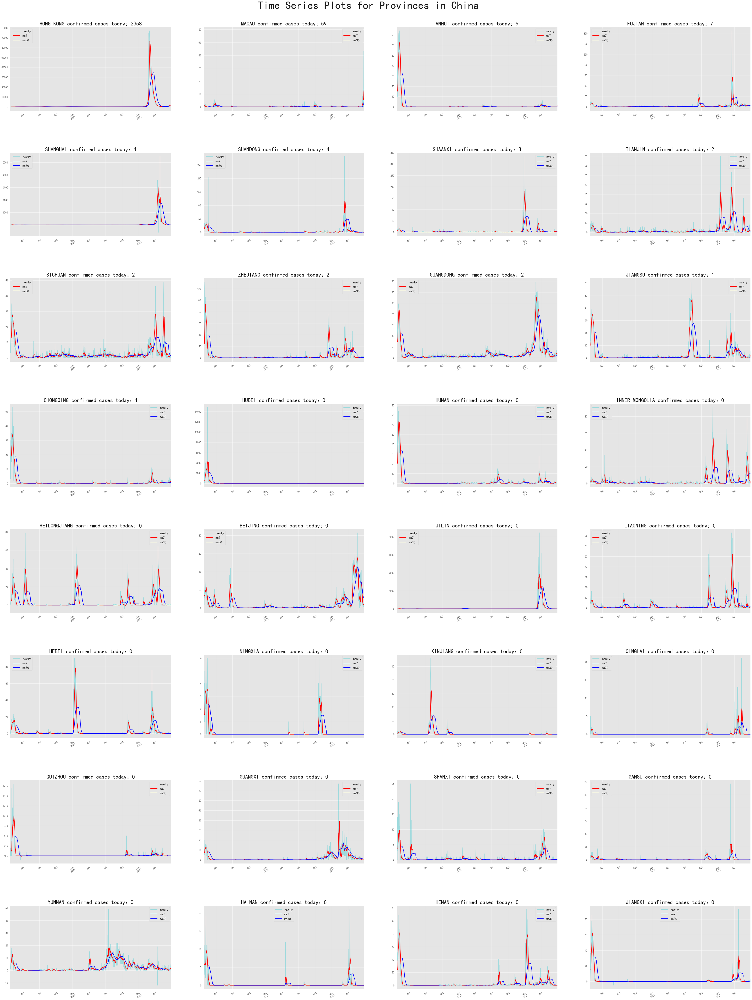

In [28]:
country = 'China'
ma = [7,30]
method = 'newly'
kind = 'confirmed'


data_copy = ts_confirmed_CHINA_incre.copy()
data_copy = data_copy.drop(['Tibet'],axis=1).sort_values(axis=1, by =data_copy.index[-1],ascending=False)
plt.style.use('ggplot')
fig, axs = plt.subplots(nrows=8, ncols=4, figsize=(15*4, 10*8))
plt.subplots_adjust(hspace=0.5)
plt.suptitle(f"Time Series Plots for Provinces in {country}", fontsize=50, y = 0.9)
for province,ax in zip(data_copy.columns, axs.ravel()):
    data_copy[province].plot(ax=ax,rot = 30, fontsize = 12,alpha = .3, label = method, color = '#06c3cc')
    data_copy[province].rolling(ma[0]).mean().plot(ax=ax,rot = 30, fontsize = 12,label = f'ma{ma[0]}',color = 'red')
    data_copy[province].rolling(ma[1]).mean().plot(ax=ax,rot = 30, fontsize = 12,label = f'ma{ma[1]}',color = 'blue')
    ax.set_title(f"{province.upper()} {kind} cases today：{int(data_copy[province].tail(1))}",fontsize = 25)
    ax.legend(fontsize = 15)
    ax.set_xlabel("")
plt.show()

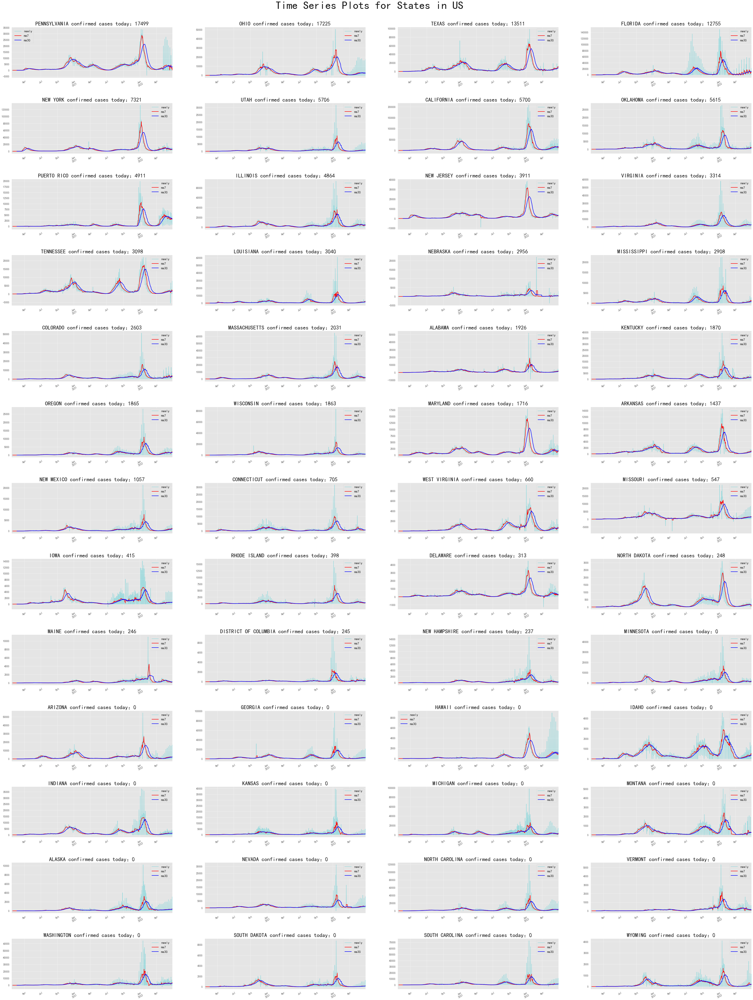

In [29]:
country = 'US'
ma = [7,30]
method = 'newly'
kind = 'confirmed'


data_copy2 = ts_confirmed_US_incre.copy()
data_copy2 = data_copy2.sort_values(axis=1, by =data_copy2.index[-1],ascending=False)
plt.style.use('ggplot')
fig, axs = plt.subplots(nrows=13, ncols=4, figsize=(15*4, 10*8))
plt.subplots_adjust(hspace=0.5)
plt.suptitle(f"Time Series Plots for States in {country}", fontsize=50, y = 0.9)
for province,ax in zip(data_copy2.columns, axs.ravel()):
    data_copy2[province].plot(ax=ax,rot = 30, fontsize = 12,alpha = .3, label = method, color = '#06c3cc')
    data_copy2[province].rolling(ma[0]).mean().plot(ax=ax,rot = 30, fontsize = 12,label = f'ma{ma[0]}',color = 'red')
    data_copy2[province].rolling(ma[1]).mean().plot(ax=ax,rot = 30, fontsize = 12,label = f'ma{ma[1]}',color = 'blue')
    ax.set_title(f"{province.upper()} {kind} cases today：{int(data_copy2[province].tail(1))}",fontsize = 25)
    ax.legend(fontsize = 15)
    ax.set_xlabel("")
plt.show()

In [30]:
data_copy2 = ts_confirmed_US_incre.copy()

specify = 'New York'
idx = data_copy2.index
ser = data_copy2[specify]
layout_title = specify.upper()
kind = 'confirmed'
method = 'incre'
ma = [7,30]

trace = go.Scatter(
            x = idx,
            y = ser,
            mode = 'lines+markers',
            name = f'{method}{kind}cases',
            opacity = .8,
            line=dict(color="#08a8c4",width = .4),
            marker = dict(color = '#5857e1',size = 1.2)
        )
trace1 = go.Scatter(
    x = idx,
    y = ser.rolling(ma[0]).mean(),
    mode = 'lines+markers',
    name = f'{ma[0]} days MA',
    opacity = .6,
    line=dict(color="#ee5090",width = 1.4),
    marker = dict(color = '#dd001b',size = 2.2)
)
trace2 = go.Scatter(
    x = idx,
    y = ser.rolling(ma[1]).mean(),
    mode = 'lines+markers',
    name = f'{ma[1]} days MA',
    opacity = .8,
    line=dict(color="#006eff",width = 2.4),
    marker = dict(color = '#412b63',size = 3.2)
)


plotdata = [trace,trace1,trace2]

'''start plotting'''

x_axis_config = {'title': 'date'}
y_axis_config = {'title': f'{kind} cases（{method.upper()}）'}
# 返回指定的图像布局和配置对象 return specific plot and obj
my_layout = Layout(title=f"【{layout_title}】recent【{kind}】cases TS line chart（{method}）",
                   xaxis=x_axis_config, yaxis=y_axis_config)
# 生成图表 generate the plot
offline.iplot({'data': plotdata, 'layout': my_layout}, filename=f'{layout_title}_COVID_TS',image_height=500,image_width=1000,image = 'png')

In [31]:
data_copy1 = ts_confirmed_CHINA_incre.copy()

specify = 'Shanghai'
idx = data_copy1.index
ser = data_copy1[specify]
layout_title = specify.upper()
kind = 'confirmed'
method = 'incre'
ma = [7,30]

trace = go.Scatter(
            x = idx,
            y = ser,
            mode = 'lines+markers',
            name = f'{method}{kind}cases',
            opacity = .8,
            line=dict(color="#08a8c4",width = .4),
            marker = dict(color = '#5857e1',size = 1.2)
        )
trace1 = go.Scatter(
    x = idx,
    y = ser.rolling(ma[0]).mean(),
    mode = 'lines+markers',
    name = f'{ma[0]} days MA',
    opacity = .6,
    line=dict(color="#ee5090",width = 1.4),
    marker = dict(color = '#dd001b',size = 2.2)
)
trace2 = go.Scatter(
    x = idx,
    y = ser.rolling(ma[1]).mean(),
    mode = 'lines+markers',
    name = f'{ma[1]} days MA',
    opacity = .8,
    line=dict(color="#006eff",width = 2.4),
    marker = dict(color = '#412b63',size = 3.2)
)


plotdata = [trace,trace1,trace2]

'''start plotting'''

x_axis_config = {'title': 'date'}
y_axis_config = {'title': f'{kind}cases（{method}）'}

my_layout = Layout(title=f"【{layout_title}】recent【{kind}】cases TS line chart（{method}）",
                   xaxis=x_axis_config, yaxis=y_axis_config)

offline.iplot({'data': plotdata, 'layout': my_layout}, filename=f'{layout_title}_COVID_TS',image_height=500,image_width=1000,image = 'png')

In [55]:
data_copy1 = ts_confirmed_CHINA_incre.copy()

specify = 'Hong Kong'
idx = data_copy1.index
ser = data_copy1[specify]
layout_title = specify.upper()
kind = 'confirmed'
method = 'incre'
ma = [7,30]

trace = go.Scatter(
            x = idx,
            y = ser,
            mode = 'lines+markers',
            name = f'{method}{kind}cases',
            opacity = .8,
            line=dict(color="#08a8c4",width = .4),
            marker = dict(color = '#5857e1',size = 1.2)
        )
trace1 = go.Scatter(
    x = idx,
    y = ser.rolling(ma[0]).mean(),
    mode = 'lines+markers',
    name = f'{ma[0]} days MA',
    opacity = .6,
    line=dict(color="#ee5090",width = 1.4),
    marker = dict(color = '#dd001b',size = 2.2)
)
trace2 = go.Scatter(
    x = idx,
    y = ser.rolling(ma[1]).mean(),
    mode = 'lines+markers',
    name = f'{ma[1]} days MA',
    opacity = .8,
    line=dict(color="#006eff",width = 2.4),
    marker = dict(color = '#412b63',size = 3.2)
)


plotdata = [trace,trace1,trace2]

'''start plotting'''

x_axis_config = {'title': 'date'}
y_axis_config = {'title': f'{kind} cases（{method.upper()}）'}
# 返回指定的图像布局和配置对象 return specific plot and obj
my_layout = Layout(title=f"【{layout_title}】recent【{kind}】cases TS line chart（{method}）",
                   xaxis=x_axis_config, yaxis=y_axis_config)
# 生成图表 generate the plot
offline.iplot({'data': plotdata, 'layout': my_layout}, filename=f'{layout_title}_COVID_TS',image_height=500,image_width=1000,image = 'png')

# 4. Time Series Basis

## 4.1 Decomposition    
- level
- trend
- seasonality
- noise  


Automatic time series decomposition:   
Statsmodel python package has `seasonal_compose()` to automatically decompose time series (specify Additive or Multiplicative model)

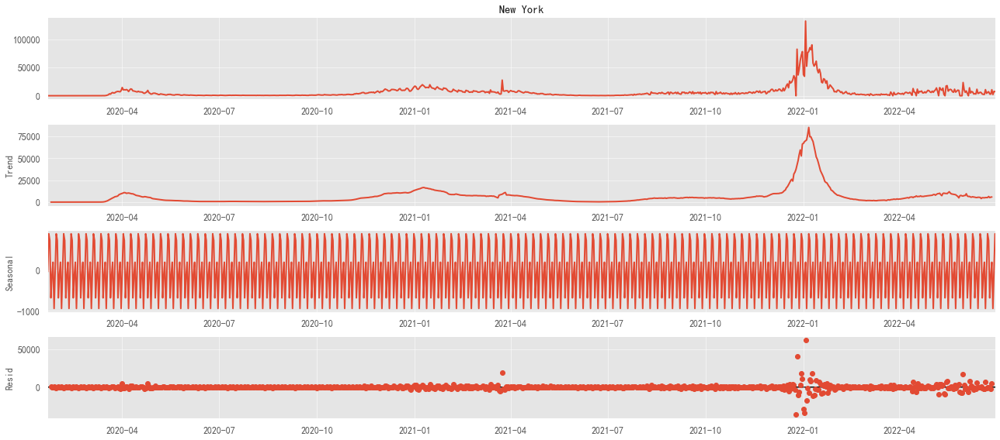

In [32]:
# NYC
nyc_series = ts_confirmed_US_incre['New York']
nyc_result = seasonal_decompose(nyc_series, model='additive')
nyc_result.plot()
plt.show() 

Trend checking methods:
- Automatic decomposing
- Moving average
- linear regression

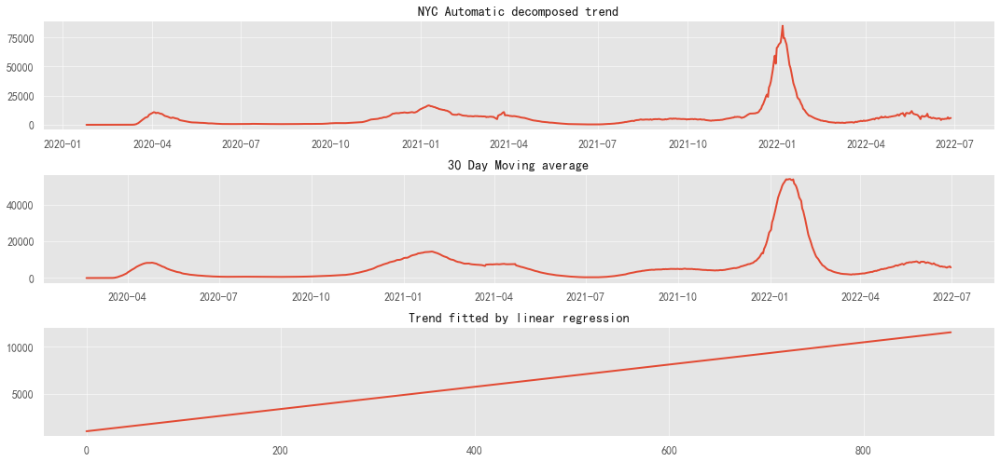

In [33]:
# NYC
fig = plt.figure(figsize=(15, 7))
layout = (3, 2)
pm_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
mv_ax = plt.subplot2grid(layout, (1, 0), colspan=2)
fit_ax = plt.subplot2grid(layout, (2, 0), colspan=2)

pm_ax.plot(nyc_result.trend)
pm_ax.set_title("NYC Automatic decomposed trend")
 
mm = nyc_series.rolling(30).mean()
mv_ax.plot(mm)
mv_ax.set_title("30 Day Moving average")


X = [i for i in range(0, len(nyc_series))]
X = np.reshape(X, (len(X), 1))
y = nyc_series
model = LinearRegression()
model.fit(X, y)
# calculate trend
trend = model.predict(X)
fit_ax.plot(trend)
fit_ax.set_title("Trend fitted by linear regression")

plt.tight_layout()

NYC series don't have an explicit linear trend. There maybe much seasonality and noise.

Seasonality:   
When it's hard to detect seasonality in very long series, just take out many small parts from the long series to check seasonality in each part.

Text(0, 0.5, '2022')

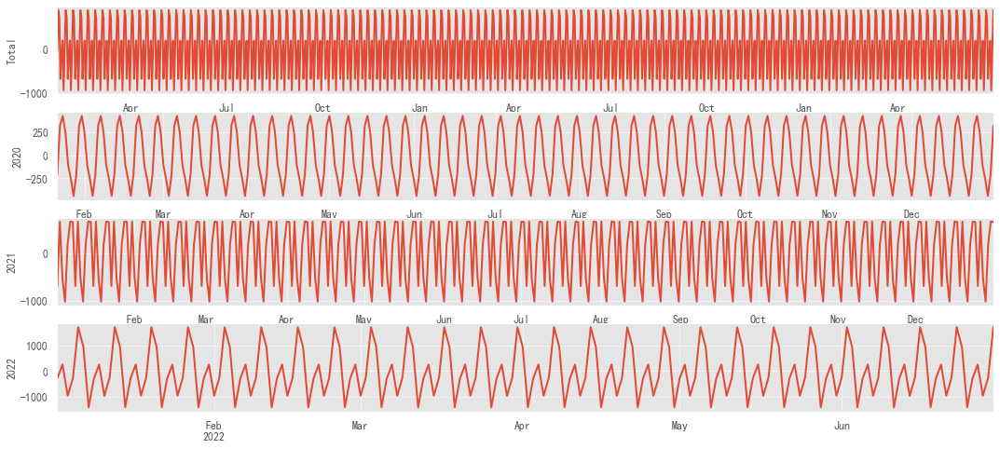

In [34]:
plt.subplot(411)
nyc_series = ts_confirmed_US_incre['New York']
nyc_result = seasonal_decompose(nyc_series, model='additive')
nyc_result.seasonal.plot()
plt.ylabel('Total')
plt.subplot(412)
nyc_series_2020 = ts_confirmed_US_incre['New York'][ts_confirmed_US_incre.index<'2021']
nyc_result_2020 = seasonal_decompose(nyc_series_2020, model='additive')
nyc_result_2020.seasonal.plot()
plt.ylabel('2020')
plt.subplot(413)
nyc_series_2021 = ts_confirmed_US_incre['New York'][(ts_confirmed_US_incre.index>'2021') &(ts_confirmed_US_incre.index<'2022')]
nyc_result_2021 = seasonal_decompose(nyc_series_2021, model='additive')
nyc_result_2021.seasonal.plot()
plt.ylabel('2021')
plt.subplot(414)
nyc_series_2022 = ts_confirmed_US_incre['New York'][ts_confirmed_US_incre.index>'2022']
nyc_result_2022 = seasonal_decompose(nyc_series_2022, model='additive')
nyc_result_2022.seasonal.plot()
plt.ylabel('2022')

In common sense, there may be more COVID cases in winter than in summer because higher temperature can kill the virus. However, the patterns above can't reveal this info.

Noise:   

Can't predict on WN. White Noise checking methods:  
- check distribution: similar to normal dist, with zero mean and constant var
- ACF
- mean changing with time or not   



Text(0.5, 1.0, 'Mean over time')

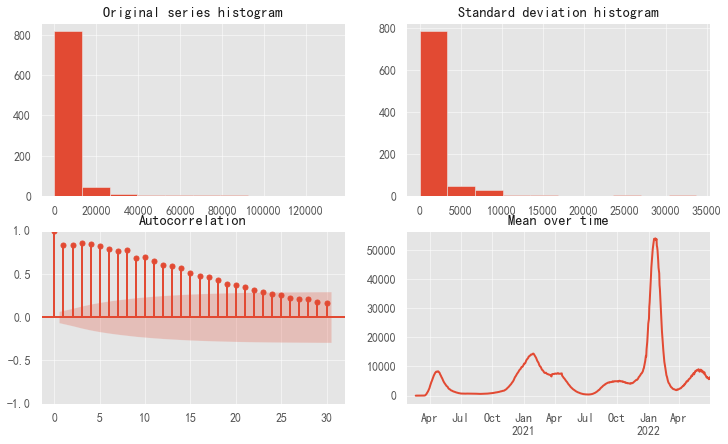

In [35]:
fig = plt.figure(figsize=(12, 7))
layout = (2, 2)
hist_ax = plt.subplot2grid(layout, (0, 0))
ac_ax = plt.subplot2grid(layout, (1, 0))
hist_std_ax = plt.subplot2grid(layout, (0, 1))
mean_ax = plt.subplot2grid(layout, (1, 1))

nyc_series.hist(ax=hist_ax)
hist_ax.set_title("Original series histogram")

plot_acf(nyc_series, lags=30, ax=ac_ax)
ac_ax.set_title("Autocorrelation")

mm = nyc_series.rolling(7).std()
mm.hist(ax=hist_std_ax)
hist_std_ax.set_title("Standard deviation histogram")

mm = nyc_series.rolling(30).mean()
mm.plot(ax=mean_ax)
mean_ax.set_title("Mean over time")

The NYC series don't have normal dist, or zero ACF--> Not WN

## 4.2 Stationary

### 4.2.1 ACF/PACF plot 

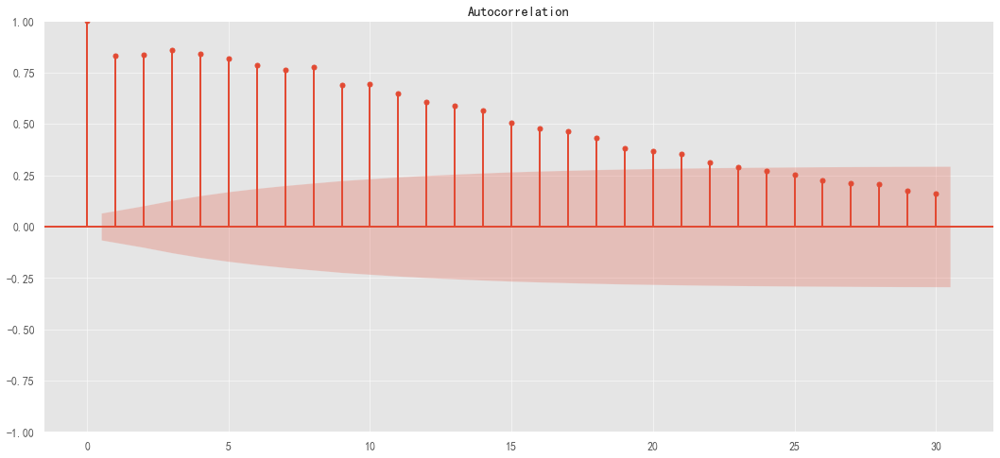

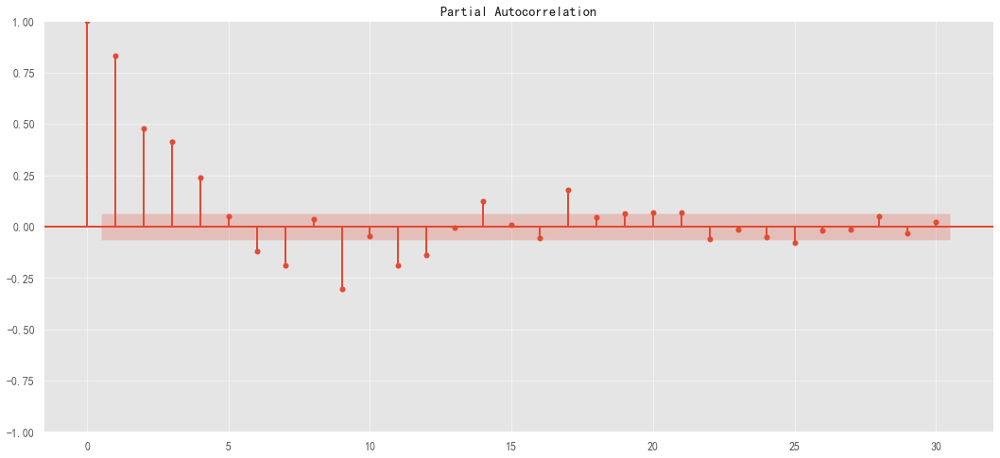

In [36]:
plot_acf(nyc_series, lags=30)
plot_pacf(nyc_series, lags=30)
plt.show()

Conclusion: ACF did not decrease to zero in a short period, so NYC ts isn't stationary.

### 4.2.2 Rolling means and standard deviation

If rolling mean and std don't change over time, TS is stationary.

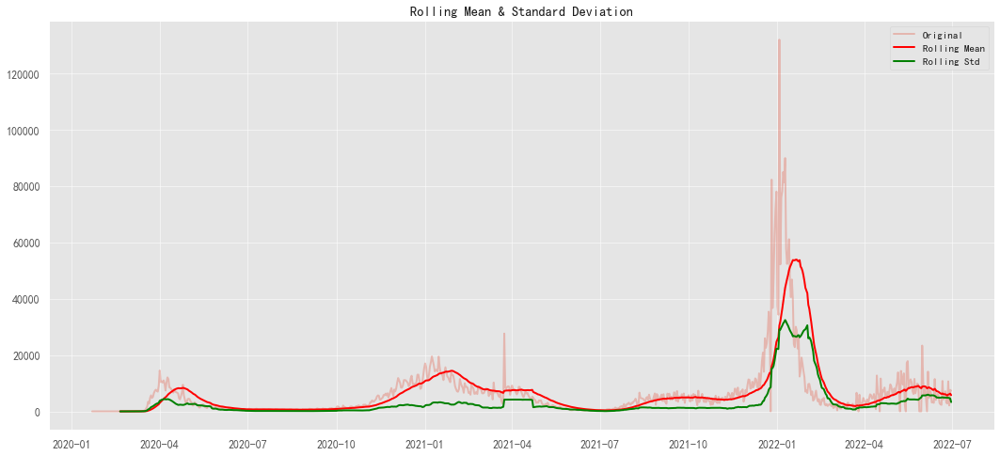

In [37]:
rolmean = nyc_series.rolling(window=30).mean()
rolstd = nyc_series.rolling(window=30).std()

# Plot rolling statistics:
orig = plt.plot(nyc_series, label='Original',alpha = .3)
mean = plt.plot(rolmean, color='red', label='Rolling Mean')
std = plt.plot(rolstd, color='green', label='Rolling Std')
plt.legend()
plt.title('Rolling Mean & Standard Deviation')
plt.show(block=False)

Conclusion: Obviously, roling mean and std change over time, so NYC ts isn't stationary.

### 4.2.3 Augmented Dickey-Fuller test

In [38]:
X = nyc_series
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -3.544505
p-value: 0.006915
Critical Values:
	1%: -3.438
	5%: -2.865
	10%: -2.569


Conclusion: p-value=0.007040 < 0.05, reject H0, which means the NYC ts is stationary.

## 4.3 Transform 

### 4.3.1 Differencing

> Differencing can help stabilize the mean of the time series by removing changes in the level of a time series, and so eliminating (or reducing) trend and seasonality.

`difference(t) = observation(t) - observation(t-1)`

In [39]:
# define diffence func
def difference(dataset, interval=1, order=1):
    for u in range(order):
        diff = list()
        for i in range(interval, len(dataset)):
            value = dataset[i] - dataset[i - interval]
            diff.append(value)
        dataset = diff
    return diff

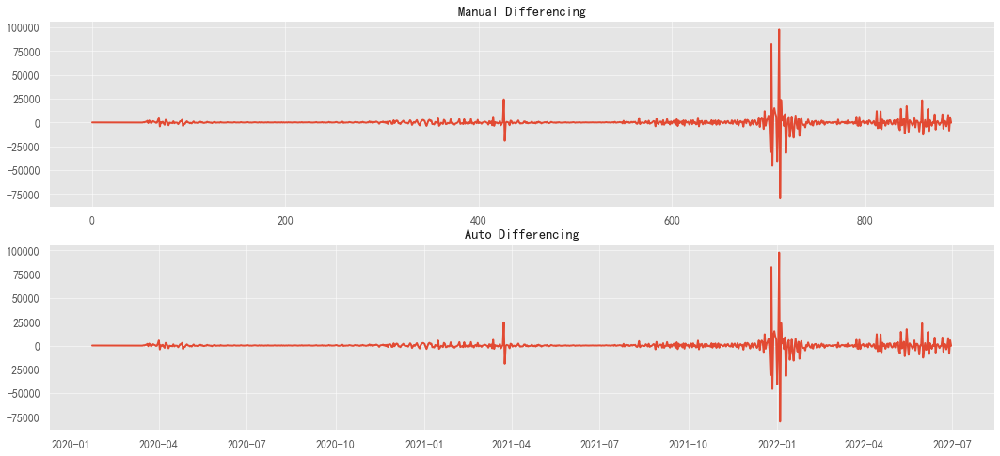

In [40]:
plt.subplot(211)
plt.title('Manual Differencing')
plt.plot(difference(nyc_series))
plt.subplot(212)
plt.title('Auto Differencing')
plt.plot(nyc_series.diff())

### 4.3.2  Log / Sqrt / Pct scale transformation

- np.log()
- np.sqrt()
- df.shift(1)/df

### 4.3.3 Smoothing

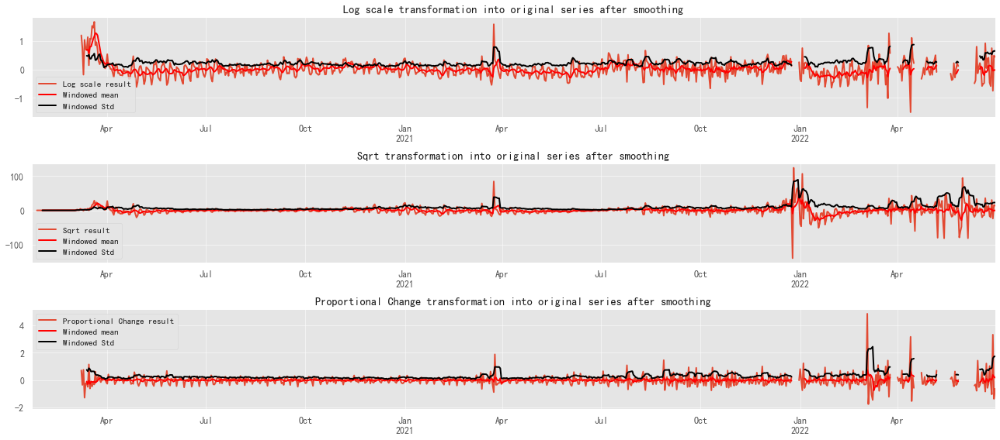

In [41]:
plt.subplot(311)
ts_log = np.log(nyc_series)
ts_log = ts_log - pd.Series(ts_log).rolling(6).mean()
ts_log.plot(label='Log scale result')
ts_log.rolling(window=6).mean().plot(color='red', label='Windowed mean')
ts_log.rolling(window=6).std().plot(color='black', label='Windowed Std')
plt.legend()
plt.title('Log scale transformation into original series after smoothing')


plt.subplot(312)
ts_sqrt = np.sqrt(nyc_series)
ts_sqrt = ts_sqrt - pd.Series(ts_sqrt).rolling(6).mean()
ts_sqrt.plot(label='Sqrt result')
ts_sqrt.rolling(window=6).mean().plot(color='red', label='Windowed mean')
ts_sqrt.rolling(window=6).std().plot(color='black', label='Windowed Std')
plt.legend()
plt.title('Sqrt transformation into original series after smoothing')

plt.subplot(313)
ts_pct = nyc_series.shift(1)/nyc_series
ts_pct = ts_pct - pd.Series(ts_pct).rolling(6).mean()
ts_pct.plot(label='Proportional Change result')
ts_pct.rolling(window=6).mean().plot(color='red', label='Windowed mean')
ts_pct.rolling(window=6).std().plot(color='black', label='Windowed Std')
plt.legend()
plt.title('Proportional Change transformation into original series after smoothing')

plt.tight_layout()

# 5. Univariate Time Series Forecasting

## 5.1 Data preparation

Split train, validation, and test sets:   
Can't use train_test_split, because time spots are dependent to each other.

```python
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y)
```

In [42]:
split_date = '2022-01-01'
df_train = ts_confirmed_US_incre.loc[ts_confirmed_US_incre.index < split_date]
df_test = ts_confirmed_US_incre.loc[ts_confirmed_US_incre.index >= split_date]
print(f"{len(df_train)} days of training data \n {len(df_test)} days of testing data ")

710 days of training data 
 181 days of testing data 


In [43]:
resultsDict = {}
predictionsDict = {}

 Use metrics=("mae", "rmse", "mape", "r2")
 - Mean Absolute Error(MAE): **mean(|yi-yi.hat|)**
 - Root Mean Squared Error(RMSE):  **sqrt(mean((yi-yi.hat)^2))**
 - Mean Absolute Percentage Error(MAPE): **mean(|yi-yi.hat|/yi)**
 - R-Squared(R2): **1-(∑(y-y.hat)^2) / (∑(y-y.ba)^2))**

In [44]:
# set naive mean as prediction benchmark
mean = df_train['New York'].mean()
mean = np.array([mean for u in range(len(df_test))])
resultsDict['Naive mean'] = evaluate(df_test['New York'], mean)
predictionsDict['Naive mean'] = mean
resultsDict['Yesterdays value'] = evaluate(
    df_test['New York'], df_test['New York'].shift(1).fillna(0))
predictionsDict['Yesterdays value'] = df_test['New York'].shift(1).fillna(0).values

In [45]:
resultsDict

{'Naive mean': {'mae': 9021.913547583847,
  'rmse': 20048.170515245965,
  'mape': 2166542681504.2014,
  'r2': -0.13307766244274788},
 'Yesterdays value': {'mae': 4660.624309392265,
  'rmse': 11362.104128484272,
  'mape': 1835082872928.6865,
  'r2': 0.6360617410325367}}

In [46]:
predictionsDict

{'Naive mean': array([4901.8028169, 4901.8028169, 4901.8028169, 4901.8028169,
        4901.8028169, 4901.8028169, 4901.8028169, 4901.8028169,
        4901.8028169, 4901.8028169, 4901.8028169, 4901.8028169,
        4901.8028169, 4901.8028169, 4901.8028169, 4901.8028169,
        4901.8028169, 4901.8028169, 4901.8028169, 4901.8028169,
        4901.8028169, 4901.8028169, 4901.8028169, 4901.8028169,
        4901.8028169, 4901.8028169, 4901.8028169, 4901.8028169,
        4901.8028169, 4901.8028169, 4901.8028169, 4901.8028169,
        4901.8028169, 4901.8028169, 4901.8028169, 4901.8028169,
        4901.8028169, 4901.8028169, 4901.8028169, 4901.8028169,
        4901.8028169, 4901.8028169, 4901.8028169, 4901.8028169,
        4901.8028169, 4901.8028169, 4901.8028169, 4901.8028169,
        4901.8028169, 4901.8028169, 4901.8028169, 4901.8028169,
        4901.8028169, 4901.8028169, 4901.8028169, 4901.8028169,
        4901.8028169, 4901.8028169, 4901.8028169, 4901.8028169,
        4901.8028169, 4901

## 5.2 Simple Exponential Smoothing (SES)

$$
\begin{equation}
  \hat{S}_{t+1|t} = \alpha x_t + \alpha(1-\alpha) x_{t-1} + \alpha(1-\alpha)^2 x_{t-2}+ \alpha(1-\alpha)^3 x_{t-3}+\cdots
\end{equation}
$$

In [47]:
# Walk throught the test data, training and predicting 1 day ahead for all the test data
index = len(df_train)                           
yhat = list()                                         # tmp list for prediction storage
for t in track(range(len(df_test['New York']))):     # track is a progress tracking bar
    temp_train = ts_confirmed_US_incre[:len(df_train)+t] 
    model = SimpleExpSmoothing(temp_train['New York'])   
    model_fit = model.fit()                              
    predictions = model_fit.predict(start=len(temp_train), end=len(temp_train))  
    yhat = yhat + [predictions]    

yhat_SES = pd.concat(yhat)      
resultsDict['SES'] = evaluate(df_test['New York'], yhat_SES.values)
predictionsDict['SES'] = yhat_SES.values

Working... ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:00:00

## 5.3 Holt Winter’s Exponential Smoothing (HWES)

In [48]:
# Walk throught the test data, training and predicting 1 day ahead for all the test data
index = len(df_train)
yhat = list()
for t in track(range(len(df_test['New York']))):
    temp_train = ts_confirmed_US_incre[:len(df_train)+t]
    model = ExponentialSmoothing(temp_train['New York'])
    model_fit = model.fit()
    predictions = model_fit.predict(start=len(temp_train), end=len(temp_train))
    yhat = yhat + [predictions]

yhat_HWES = pd.concat(yhat)
resultsDict['HWES'] = evaluate(df_test['New York'], yhat_HWES.values)
predictionsDict['HWES'] = yhat_HWES.values

Working... ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:00:00

## 5.4 Autoregression (AR)

AR(p) model:
$$y_{t} = c + \phi_{1}y_{t-1} + \phi_{2}y_{t-2} + \dots + \phi_{p}y_{t-p} + \varepsilon_{t},$$

In [49]:
# Walk throught the test data, training and predicting 1 day ahead for all the test data
index = len(df_train)
yhat = list()
for t in track(range(len(df_test['New York']))):
    temp_train = ts_confirmed_US_incre[:len(df_train)+t]
    model = AutoReg(temp_train['New York'],lags=1)
    model_fit = model.fit()
    predictions = model_fit.predict(start=len(temp_train), end=len(temp_train))
    yhat = yhat + [predictions]

yhat_AR = pd.concat(yhat)
resultsDict['AR'] = evaluate(df_test['New York'], yhat_AR.values)
predictionsDict['AR'] = yhat_AR.values

Working... ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:00:00

## 5.5 Moving Average (MA)
MA(q) model:
$$y_{t} = c + \varepsilon_t + \theta_{1}\varepsilon_{t-1} + \theta_{2}\varepsilon_{t-2} + \dots + \theta_{q}\varepsilon_{t-q}$$

In [50]:
# Walk throught the test data, training and predicting 1 day ahead for all the test data
from statsmodels.tsa.arima.model import ARIMA as ARIMA
index = len(df_train)
yhat = list()
for t in track(range(len(df_test['New York']))):
    temp_train = ts_confirmed_US_incre[:len(df_train)+t]
    model = ARIMA(temp_train['New York'],order=(0, 0, 1))
    model_fit = model.fit()
    predictions = model_fit.predict(start=len(temp_train), end=len(temp_train))
    yhat = yhat + [predictions]

yhat_MA = pd.concat(yhat)
resultsDict['MA'] = evaluate(df_test['New York'], yhat_MA.values)
predictionsDict['MA'] = yhat_MA.values

Working... ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:00:00

## 5.6 Auto - SARIMA

For the AR(o=1) and MA(q=1) models above, order=1 is chosen arbitrarily. Therefore, use auto-SARIMA model here to automatically find the best parameters.

Performing stepwise search to minimize aic
 ARIMA(2,2,2)(1,0,1)[6]             : AIC=13313.882, Time=2.39 sec
 ARIMA(0,2,0)(0,0,0)[6]             : AIC=14640.016, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[6]             : AIC=14146.943, Time=0.15 sec
 ARIMA(0,2,1)(0,0,1)[6]             : AIC=inf, Time=0.62 sec
 ARIMA(2,2,2)(0,0,1)[6]             : AIC=13327.855, Time=1.69 sec
 ARIMA(2,2,2)(1,0,0)[6]             : AIC=13366.697, Time=0.72 sec
 ARIMA(2,2,2)(2,0,1)[6]             : AIC=13316.741, Time=2.63 sec
 ARIMA(2,2,2)(1,0,2)[6]             : AIC=13319.202, Time=3.13 sec
 ARIMA(2,2,2)(0,0,0)[6]             : AIC=13347.733, Time=0.68 sec
 ARIMA(2,2,2)(0,0,2)[6]             : AIC=13316.638, Time=2.33 sec
 ARIMA(2,2,2)(2,0,0)[6]             : AIC=13363.630, Time=1.18 sec
 ARIMA(2,2,2)(2,0,2)[6]             : AIC=13356.182, Time=3.53 sec
 ARIMA(1,2,2)(1,0,1)[6]             : AIC=inf, Time=1.81 sec
 ARIMA(2,2,1)(1,0,1)[6]             : AIC=13411.955, Time=1.63 sec
 ARIMA(3,2,2)(1,0,1)[6]        

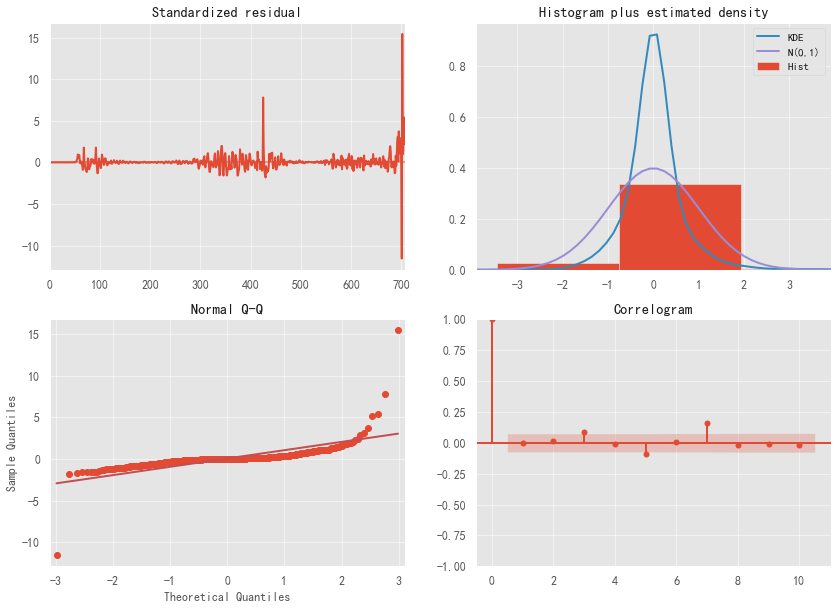

In [51]:
# building the model
autoModel = pm.auto_arima(df_train['New York'], trace=True, error_action='ignore',
                          suppress_warnings=True, seasonal=True, m=6, stepwise=True)
autoModel.plot_diagnostics(figsize=(14,10))
plt.show()

In [52]:
best_order = autoModel.order
seasonalOrder = autoModel.seasonal_order
# model0 = ARIMA(df_train['New York'],order = best_order)
# model_fit0 =model0.fit(disp=False)
yhat = list()
for t in track(range(len(df_test['New York']))):
    temp_train = ts_confirmed_US_incre[:len(df_train)+t]
    model = SARIMAX(temp_train['New York'],
                    order = best_order,
                   seasonal_order=seasonalOrder)
    model_fit = model.fit(disp=False,transparams=False)
    predictions = model_fit.predict(start=len(temp_train), end=len(temp_train),dynamic=False)
    yhat = yhat + [predictions]
yhat_AutoSARIMAX = pd.concat(yhat)
resultsDict['AutoSARIMAX  {0}'.format(best_order,seasonalOrder)] = evaluate(
    df_test['New York'], yhat_AutoSARIMAX)
predictionsDict['AutoSARIMAX  {0}'.format(best_order,seasonalOrder)] = yhat_AutoSARIMAX.values

Working... ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:00:00

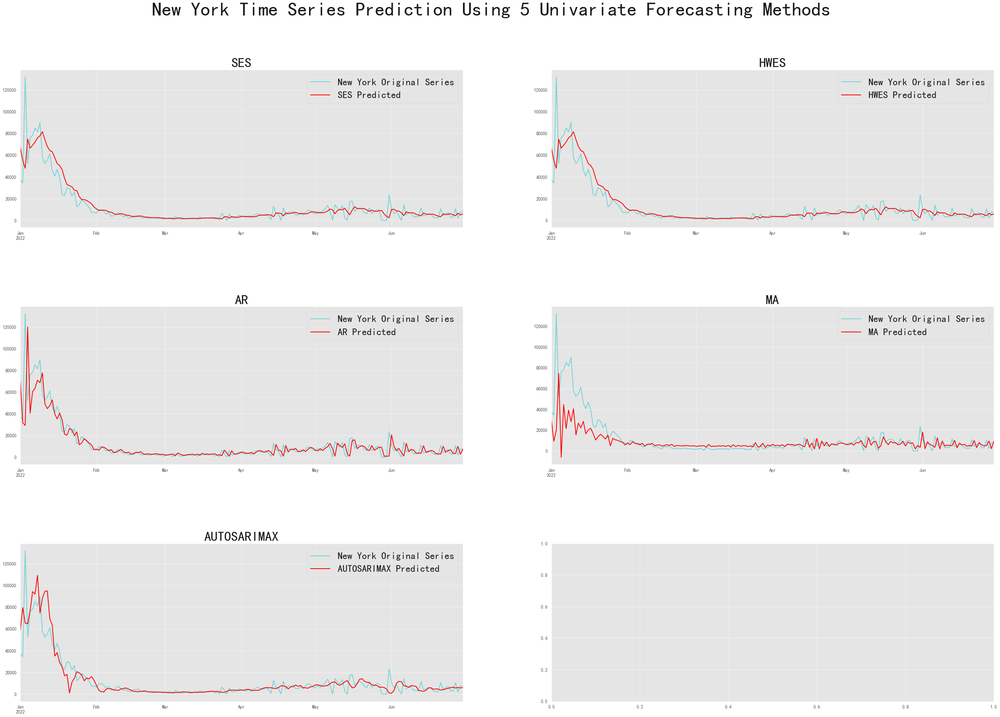

In [53]:
yhat_dict = {
    'SES':yhat_SES,
    'HWES':yhat_HWES,
    'AR':yhat_AR,
    'MA':yhat_MA,
    'AUTOSARIMAX':yhat_AutoSARIMAX
}


fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(3*15, 10*3))
plt.subplots_adjust(hspace=0.5)
plt.suptitle("New York Time Series Prediction Using 5 Univariate Forecasting Methods", fontsize=50, y = .96)
for yhat_key,ax in zip(yhat_dict.keys(), axs.ravel()):
    df_test['New York'].plot(ax=ax,alpha = .5, label = "New York Original Series", color = '#06c3cc')
    yhat_dict[yhat_key].plot(ax=ax,color = 'red',label=f'{yhat_key} Predicted')
    ax.set_title(f"{yhat_key.upper()}",fontsize = 35)
    ax.legend(fontsize = 25)
    ax.set_xlabel("")
plt.show()

In [54]:
with open('scores.pickle', 'wb') as handle:
    pickle.dump(resultsDict, handle, protocol=pickle.HIGHEST_PROTOCOL)

with open('predictions.pickle', 'wb') as handle:
    pickle.dump(predictionsDict, handle, protocol=pickle.HIGHEST_PROTOCOL)
    
result_df = pd.DataFrame.from_dict(resultsDict).T
result_df

,mae,rmse,mape,r2
Naive mean,9021.913548,20048.170515,2.166543e+12,-0.133078
Yesterdays value,4660.624309,11362.104128,1.835083e+12,0.636062
SES,4264.490830,9012.293227,2.917895e+12,0.771029
HWES,4264.490830,9012.293227,2.917895e+12,0.771029
AR,4710.368544,11258.798946,1.988396e+12,0.642650
MA,6875.620718,15070.705784,2.128559e+12,0.359709
"AutoSARIMAX (2, 2, 2)",4802.392578,9738.436702,3.447249e+12,0.732645
